Note: Lime is used instead of Shap as Shap is fundamentally not compatible with LSTMs with multi-class data and will give errors (ref: https://discuss.tensorflow.org/t/attributeerror-exception-encountered-when-calling-layer-lstm/22435 , https://github.com/shap/shap/issues/2808)

In [124]:
#!pip install lime

## Importing the libraries

In [1]:
import pandas as pd
import shap
import numpy as np
from tensorflow.keras.models import load_model
from gensim.models import KeyedVectors
import tensorflow as tf

## The dataframe is defined

In [27]:
df = pd.read_csv("lakh.csv")

In [123]:
df.head(5)

,Unnamed: 0,id,file,song_name,album_name,artist_name,artist_mb,tag_echo,tag_mbz,year,embedding
0,0,TRRRUFD12903CD7092,R/R/U/TRRRUFD12903CD7092/6c460e4c53ab8c0b87f08...,Wastelands,Alien 4,Hawkwind,5a28f8c2-31fb-4047-ae57-c5c326989262,space rock,british,1994,"[-0.17479022, 0.073780425, 0.49907172, 0.03215..."
1,1,TRRRUTV12903CEA11B,R/R/U/TRRRUTV12903CEA11B/a8a167f3ab4d81560b650...,Runaway,Songs of Del Shannon,Del Shannon,2e885bfb-1f59-49cf-8d51-e743445e1b48,ballad,classic pop and rock,1961,"[-0.33292776, 0.021969806, 0.68885314, 0.28228..."
2,2,TRRRUJO128E07813E7,R/R/U/TRRRUJO128E07813E7/ed75fd62360e499037c03...,Have You Met Miss Jones? (Swing When Version),Swing When You're Winning,Robbie Williams,db4624cf-0e44-481e-a9dc-2142b833ec2f,british pop,pop,2001,"[0.11866359, -0.3533733, 0.40039137, -0.042768..."
3,3,TRRRIYO128F428CF6F,R/R/I/TRRRIYO128F428CF6F/c8e58336ab243fc07c966...,Goodbye,Bittersweet,Volebeats,eb567c55-368d-4b85-b969-ca9e3252f9cb,alternative country,NaN,0,"[0.19119988, -0.10447814, 0.041001473, 0.23734..."
4,4,TRRRILO128F422FFED,R/R/I/TRRRILO128F422FFED/0ec315d7be357f130de52...,La Colegiala,Musica Tropical De Colombia 5,Rodolfo Y Su Tipica Ra7,ead8d6d9-e58b-4dd8-916f-cf7f359db38e,cumbia,NaN,1997,"[0.5044735, -0.04309893, 0.37455863, 0.1530743..."


## The trained model is loaded

In [73]:
model = load_model('../birnn1.h5')

## The embeddings are loaded

In [8]:
emb = KeyedVectors.load_word2vec_format('lmd.bin', binary=False)

### The embeddings for the corresponding song ids are extracted

In [30]:
ids = [i for i in df['id'].tolist() if i in emb]

### Data here is the embeddings

In [75]:
data = np.array([emb[i] for i in ids])

In [125]:
def predict_fn(embeddings):
    """This function gives predictions for the model"""
    predictions = model.predict(embeddings)
    return predictions

## The tabular explainer is used for explaining the embeddings as Lime does not have an inbuilt audio explainer but the tabular explainer can still treat each dimension of the embeddings as a feature

In [35]:
from lime import lime_tabular

In [107]:
explainer = lime_tabular.LimeTabularExplainer(data, mode="classification", feature_names=None)

Note: All songs in the dataset do not have explainations as songs of only 21 genres have been used to train the model. You can find the 21 genres in the tag_mbz column of df as mentioned below: 
"Alternative Rock","American","British","Canadian","Classic Pop and Rock", "Classical", "Country", "Finnish", "Folk","French","German","Hard Rock","Hip Hop, R&B, and Dance Hall","Italian","Pop","Pop and Chart", "Progressive Rock","Rock","Rock and Indie","Soul and Reggae","UK"

### This is the explaination corresponding to the first song in the dataset

In [108]:
instance_idx = 0  
explanation = explainer.explain_instance(data[instance_idx], predict_fn, top_labels=5)

157/157 [==============================] - 5s 31ms/step


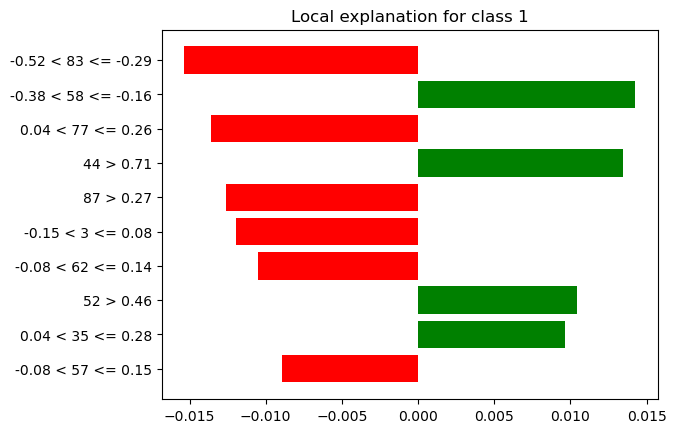

In [109]:
import matplotlib.pyplot as plt

# Plot the explanation
fig = explanation.as_pyplot_figure()
plt.show()

This figure shows the explaination for the first song and depicts how the output of the model corresponding to the first song which is "12" or "hard rock". The below figure shows the impact of each dimension of the embeddings. For an example, Feature 99 has an impact of 0.12 while Feature 5 has an impact of -0.49

In [110]:
explanation.show_in_notebook()

### The explaination for the 11th song in the dataset is as follows:

157/157 [==============================] - 5s 31ms/step


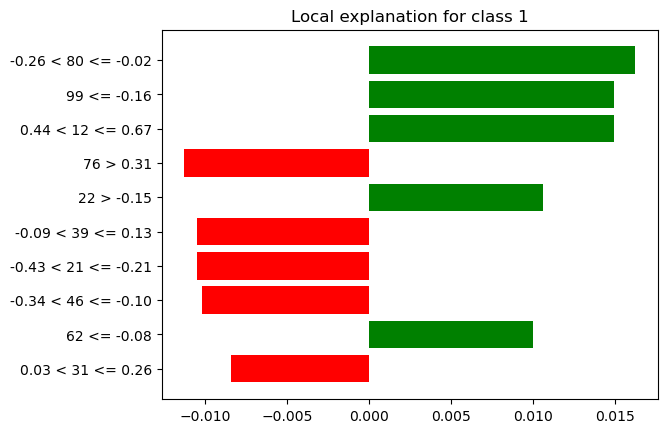

In [111]:
explanation = explainer.explain_instance(data[10], predict_fn, top_labels=5)
fig = explanation.as_pyplot_figure()
plt.show()

In [112]:
explanation.show_in_notebook()

### The explaination for the 46th song in the dataset is as follows:

157/157 [==============================] - 5s 32ms/step


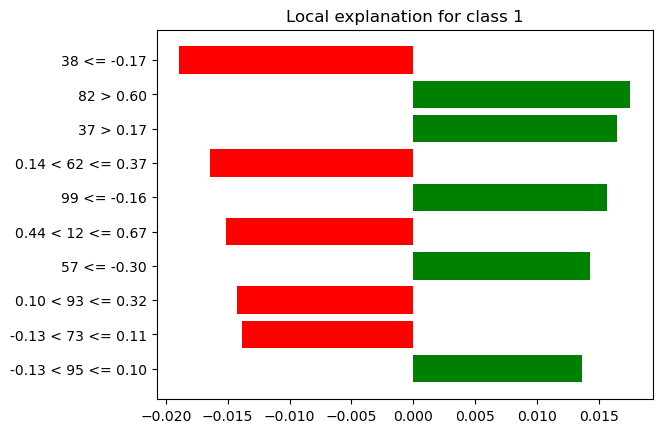

In [113]:
explanation = explainer.explain_instance(data[45], predict_fn, top_labels=5)
fig = explanation.as_pyplot_figure()
plt.show()

In [114]:
explanation.show_in_notebook()

### The explaination for the 99th song in the dataset is as follows:

157/157 [==============================] - 5s 32ms/step


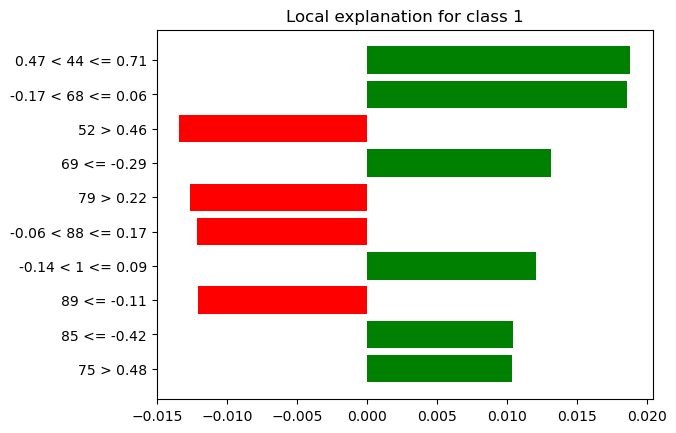

In [115]:
explanation = explainer.explain_instance(data[98], predict_fn, top_labels=5)
fig = explanation.as_pyplot_figure()
plt.show()

In [116]:
explanation.show_in_notebook()

### The explaination for the 27th song in the dataset is as follows:

157/157 [==============================] - 5s 32ms/step


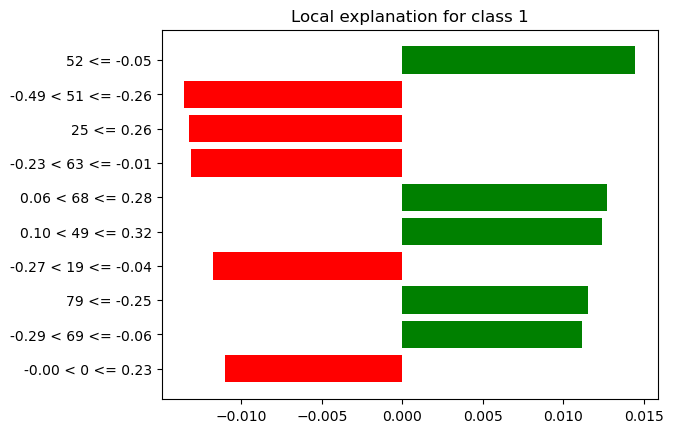

In [117]:
explanation = explainer.explain_instance(data[26], predict_fn, top_labels=5)
fig = explanation.as_pyplot_figure()
plt.show()

In [118]:
explanation.show_in_notebook()

### The explaination for the 246th song in the dataset is as follows:

157/157 [==============================] - 5s 32ms/step


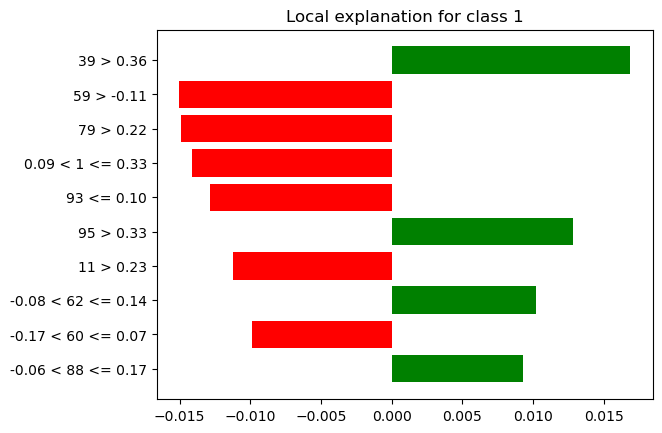

In [119]:
explanation = explainer.explain_instance(data[245], predict_fn, top_labels=5)
fig = explanation.as_pyplot_figure()
plt.show()

In [120]:
explanation.show_in_notebook()

### The explaination for the 876th song in the dataset is as follows:

157/157 [==============================] - 5s 32ms/step


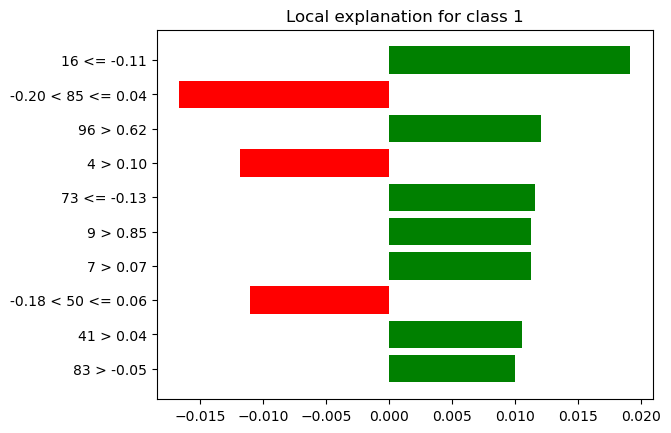

In [121]:
explanation = explainer.explain_instance(data[875], predict_fn, top_labels=5)
fig = explanation.as_pyplot_figure()
plt.show()

In [122]:
explanation.show_in_notebook()

## Below, the first 2000 songs in the dataset are group into clusters to show the spacial distribution of the embeddings of the songs

In [39]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import plotly.express as px

In [40]:
data.shape

(30975, 100)

### The first 2000 song embeddings are extracted

In [41]:
first_2000 = data[:2000]

### KMeans is used to cluster the sings into 5 clusters

In [42]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(first_2000)

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


### TSNE is used to bring down the dimensions of the songs from 100 to 2 to make visualization easier

In [43]:
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(first_2000)

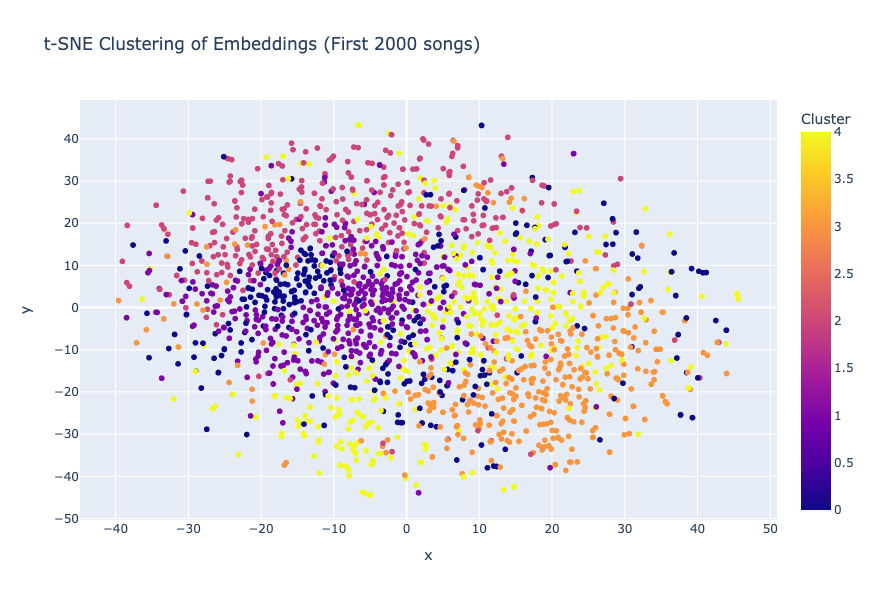

In [45]:
fig = px.scatter(x=embeddings_2d[:, 0], y=embeddings_2d[:, 1], color=clusters,
                 labels={'color': 'Cluster'}, title='t-SNE Clustering of Embeddings (First 2000 songs)')
fig.update_layout(height=600)
fig.show()